In [1]:
import scanpy as sc
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

In [4]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['font.family'] = 'sans-serif'

In [3]:
adata_emb = sc.read_h5ad('/lustre/groups/ml01/workspace/hpca/hpca_downstream/Final_Embedding_Healthy/final_embedding_healthy.h5ad')

In [4]:
adata = sc.read_h5ad('/lustre/groups/ml01/workspace/hpca/hpca_downstream/2026_final_object_healthy_hvg.h5ad')

In [5]:
len(adata.obs.donor_id.unique())

109

In [7]:
adata.obsm['X_emb'] = adata_emb.X
adata.obsm['X_umap'] = adata_emb.obsm['UMAP_scanvi_global_lineage']
adata.obsp['connectivities'] = adata_emb.obsp['scanvi_neighbors_global_lineage_connectivities']
adata.obsp['neighbors'] = adata_emb.obsp['scanvi_neighbors_global_lineage_distances']

In [2]:
# Scanpy / matplotlib color palettes for diabetes-extended pancreas atlas
# All category names and hex colors are quoted for consistency.
# Disease-associated states with suffix _T1D, _T2D, and _aab are assigned high-contrast colors.
hpca_colors = {
  'Level_3' : {
    'Pancreatic Polypeptide Cell': '#8e44ad',
    'Alpha Cell': '#e67e22',
    'Beta Cell': '#1f77b4',     
    'Ductal Cell': '#17becf',
    'Stellate Cell': '#a6761d',
    'Delta Cell': '#2ca02c',
    'Mixed Endocrine Cell': '#7f7f7f',
    'Pericyte': '#8c564b',
    'T Cell': '#d62728',
    'Epsilon Cell': '#bcbd22',
    'Schwann Cell': '#9467bd',
    'Endothelial Cell': '#1b9e77',
    'Acinar Cell': '#66a61e',
    'Mast Cell': '#e7298a',
    'Fibroblast': '#b15928',
    'Macrophage': '#ff7f0e',
    'NK Cell': '#fb9a99',
    'Smooth Muscle Cell': '#6a3d9a',
    'Plasma Cell': '#cab2d6',
    'Adipocyte': '#fdbf6f',
    'Delta Cell_T1D': '#e53935',
    'Beta Cell_T1D': '#8e24aa',
    'Alpha Cell_T1D': '#d81b60',
    'Pancreatic Polypeptide Cell_T1D': '#ad1457',
    'Alpha Cell_T2D': '#00acc1',
    'Beta Cell_T2D': '#1e88e5',
    'Delta Cell_T2D': '#00e5ff',
    'Pancreatic Polypeptide Cell_T2D': '#1565c0',
    'Beta Cell_aab': '#ffb300',
    'Alpha Cell_aab': '#fdd835',
    'Delta Cell_aab': '#ff8f00',
    'Pancreatic Polypeptide Cell_aab': '#f57f17',
    'B Cell': '#e91e63',
  },
  'Dataset' : {
    'GSE101207_remapped': '#1f77b4',
    'GSE198623': '#ff7f0e',
    'GSE84133_remapped': '#2ca02c',
    'GSE183568': '#d62728',
    'Karakose': '#9467bd',
    'Tabula_Sapiens': '#8c564b',
    'GSE150724': '#e377c2',
    'GSE114297_remapped': '#7f7f7f',
    'HPAP': '#bcbd22',
    'Espace': '#17becf',
    'charite_snRNA': '#393b79',
    'Jimenez': '#637939',
    'GSE251913': '#8c6d31'
  },
  'suspension_type' : { 
    'cell': '#4c78a8',
    'nucleus': '#f58518',
  },
  'Level_4_extension_diabetes_simplified' : { 
    'Pancreatic Polypeptide Cell': '#562097',
    'Alpha Cell: GCG_Mid': '#974d20',
    'Beta Cell: Secretory Granules': '#206b97',
    'Alpha Cell: GCG_High': '#b26722',
    'Ductal Cell: Oxidative Stress': '#20978a',
    'Alpha Cell: Interferon Response': '#cf8822',
    'Alpha Cell: High OxPhos': '#e16f2c',
    'Beta Cell: Immediate Early Activation': '#216bb0',
    'Beta Cell: Interferon Response': '#2166c9',
    'Ductal Cell: CFTR Transport': '#23b8b8',
    'Beta Cell: INS_Mid, IAPP_High': '#239ae0',
    'Beta Cell: Oxidative Stress': '#4591d7',
    'Beta Cell: Dedifferentiation-like': '#568fdf',
    'Alpha Cell: Dedifferentiation-like': '#da9250',
    'Stellate Cell: Quiescent': '#973020',
    'Alpha Cell: ER Stress': '#e2ae65',
    'Delta Cell': '#289720',
    'Pancreatic Polypeptide Cell: ER Stress': '#8026c8',
    'Beta Cell: INS_Low': '#69b7e6',
    'Alpha-Beta-Delta Cell': '#e9a37a',
    'Alpha Cell: Mature Identity': '#efbe90',
    'Alpha Cell: Oxidative Stress': '#a36e23',
    'Alpha Cell: GCG_Low': '#be5d24',
    'Beta Cell: ER Stress': '#7cb6ec',
    'Ductal Cell: Centroacinar Cell': '#24c7db',
    'Delta Cell: High OxPhos': '#25c22b',
    'Delta Cell: Oxidative Stress': '#38de51',
    'Ductal Cell: EMT Transition': '#3fe4d2',
    'Ductal Cell: Injury Reactive': '#68dfdf',
    'Beta Cell: High OxPhos': '#98b9e9',
    'Beta Cell: Ion Channel Activity': '#1f73a5',
    'Alpha Cell: Proliferating': '#db7c24',
    'Ductal Cell: Proliferating': '#83dde8',
    'Beta Cell: Proliferating': '#1f72be',
    'Pancreatic Polypeptide Cell: Oxidative Stress': '#ac43e0',
    'Delta Cell: ER Stress': '#68e85e',
    'Ductal Cell: Mucin Secretion': '#9fefe6',
    'Pancreatic Polypeptide Cell: High OxPhos': '#a66eea',
    'Pericyte': '#d75228',
    'Pancreatic Polypeptide Cell: Interferon Response': '#cba3eb',
    'T Cell: CD8+': '#97203b',
    'Pancreatic Polypeptide Cell: Proliferating': '#8121b1',
    'Delta Cell: Interferon Response': '#8fe792',
    'Epsilon Cell': '#d7c142',
    'Beta Cell: Mature Identity': '#1f6bd8',
    'Ductal Cell: Interferon Response': '#19b1b1',
    'Delta Cell: Proliferating': '#21ae36',
    'Schwann Cell': '#e58f61',
    'Ductal Cell': '#2ab3c3',
    'Endothelial Cell: Vascular': '#209760',
    'Delta Cell: Dedifferentiation-like': '#30db24',
    'Beta Cell: INS_High': '#3b9cd5',
    'Beta Cell: INS_Mid': '#4c97dd',
    'Stellate Cell: Activated': '#f1a89d',
    'Acinar Cell: Quiescent': '#699720',
    'Mast Cell': '#972220',
    'Alpha Cell: GCG_Low, POU6F2_High': '#e39d39',
    'Acinar Cell: Digestive Secretion': '#6fbb23',
    'Acinar Cell: Oxidative Stress': '#6fdc2a',
    'Acinar Cell: CBS': '#a7e547',
    'Acinar Cell: Transitional': '#aae172',
    'Ductal Cell: SLC4A4_pos': '#37d9c8',
    'Fibroblast: CAF-like': '#b54927',
    'Ductal Cell: Ionocyte Like': '#52e3e3',
    'Acinar Cell: Interferon Response': '#b3ea90',
    'Acinar Cell: ADM Plasticity': '#75ae1d',
    'Acinar Cell: Proliferating': '#79d41e',
    'Acinar Cell: Injury Response': '#7cd742',
    'Macrophage: Proliferating': '#d94834',
    'Beta Cell: INS_High, IAPP_Low': '#5e95e4',
    'Acinar Cell: Idling': '#aee15f',
    'Macrophage: Activated': '#e9937a',
    'Acinar Cell': '#b3ea7d',
    'Endothelial Cell: Lymphatic': '#a1edd2',
    'Macrophage: Stressed': '#c61e1c',
    'Endothelial Cell': '#43e0b8',
    'Ductal Cell: PanIN': '#6eddea',
    'Treg: Resting': '#be2436',
    'Macrophage: Neural': '#dc6b5c',
    'Ductal Cell: Immature': '#94e8df',
    'Macrophage: Tissue resident': '#edb2a1',
    'Alpha Cell: GCG_High, IRX2_High': '#dc8c5c',
    'T Cell: Naive CD4+': '#dd3032',
    'B Cell': '#e75274',
    'Treg: Activated': '#e47f8b',
    'NK Cell': '#eda1a2',
    'T Cell: CM CD4+': '#b01d3e',
    'Smooth Muscle Cell': '#dc7b47',
    'Plasma Cell': '#d91f35',
    'Acinar Cell: PanIN': '#bef19d',
    'T Cell: Peripheral helper': '#d84a4c',
    'Treg: Proliferating': '#e36b86',
    'T Cell: EM CD4+': '#ec8c98',
    'Adipocyte': '#ea8e80',
    'Delta Cell_T1D': '#e53935',
    'Beta Cell_T1D': '#8e24aa',
    'Alpha Cell_T1D': '#d81b60',
    'Pancreatic Polypeptide Cell_T1D': '#ad1457',
    'Alpha Cell_T2D': '#00acc1',
    'Beta Cell_T2D': '#1e88e5',
    'Delta Cell_T2D': '#00e5ff',
    'Pancreatic Polypeptide Cell_T2D': '#1565c0',
    'Beta Cell_aab': '#ffb300',
    'Alpha Cell_aab': '#fdd835',
    'Delta Cell_aab': '#ff8f00',
    'Pancreatic Polypeptide Cell_aab': '#f57f17',
}
}

In [3]:
sc.set_figure_params(frameon=False, vector_friendly=True, dpi_save=300)

In [14]:
adata.obs['Level_3'] = adata.obs['Level_3'].cat.add_categories('B Cell')

In [15]:
adata.obs.loc[adata.obs['Level_4'] == 'B Cell', 'Level_3'] = 'B Cell'

In [18]:
adata.write_h5ad('/lustre/groups/ml01/workspace/hpca/hpca_downstream/2026_final_object_healthy_hierarchy.h5ad')

In [5]:
adata = sc.read_h5ad('/lustre/groups/ml01/workspace/hpca/hpca_downstream/2026_final_object_healthy_hierarchy.h5ad')

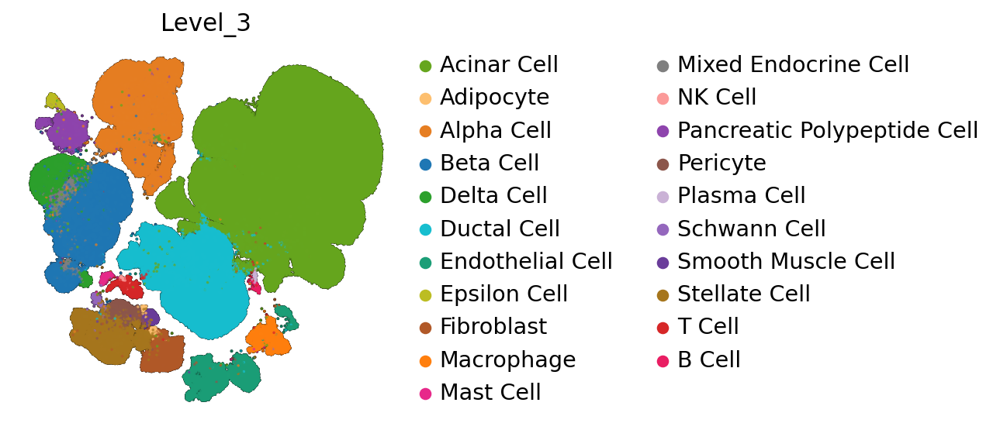

In [16]:
fig = sc.pl.umap(
    adata,
    color='Level_3',
    frameon=False, show=False,
    palette=hpca_colors['Level_3'],
    add_outline=True,
    outline_width=(0.1, 0.05),
    outline_color=['white', 'black'],
    na_color='lightgray',
    alpha=0.75,
    sort_order=True,
    size=10,
    na_in_legend=False,
).figure
fig.savefig(
    '/lustre/groups/ml01/workspace/hpca/hpca_downstream/annotation_plotting/level_3_healthy_umap.svg',
    format='svg',
    bbox_inches='tight',
    pad_inches=0.3,

)

In [35]:
adata.obs.Level_3.value_counts()

Level_3
Acinar Cell                    464242
Ductal Cell                    140970
Alpha Cell                     133336
Beta Cell                      100121
Stellate Cell                   24855
Endothelial Cell                18726
Delta Cell                      16312
Pancreatic Polypeptide Cell     11185
Fibroblast                       8404
Macrophage                       5629
Pericyte                         5192
Mixed Endocrine Cell             4898
T Cell                           3601
Smooth Muscle Cell               1300
Mast Cell                        1045
Epsilon Cell                      954
Schwann Cell                      838
Adipocyte                         539
NK Cell                           121
Plasma Cell                        53
Name: count, dtype: int64

## Level_3 canonical marker UMAPs

One defining marker per major `Level_3` type on the global UMAP. Low or zero expression is shown in grey; expressing cells use each lineage color from `hpca_colors`.

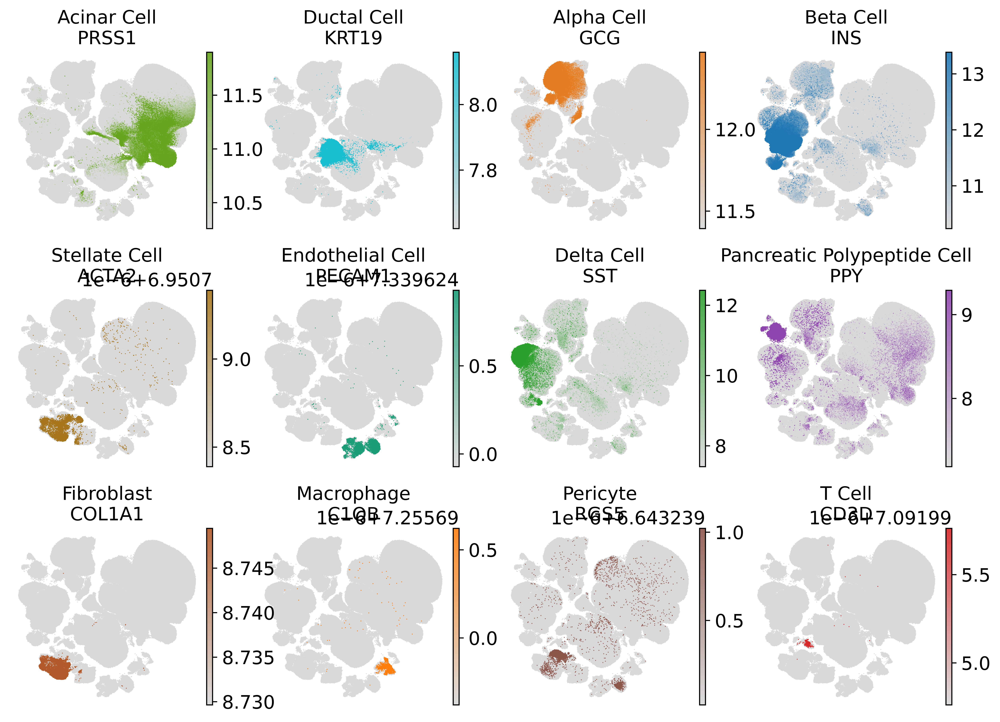

saved /lustre/groups/ml01/workspace/hpca/hpca_downstream/annotation_plotting/level_3_markers/level_3_marker_umaps.svg


In [11]:
import numpy as np
import matplotlib.colors as mcolors
from pathlib import Path

# Canonical markers for the main Level_3 lineages (ordered by abundance)
LEVEL_3_MARKERS = [
    ('Acinar Cell', 'PRSS1'),                 # digestive enzyme
    ('Ductal Cell', 'KRT19'),                 # ductal cytokeratin
    ('Alpha Cell', 'GCG'),                    # glucagon
    ('Beta Cell', 'INS'),                     # insulin
    ('Stellate Cell', 'ACTA2'),                # pancreatic stellate / myofibroblast
    ('Endothelial Cell', 'PECAM1'),           # vascular endothelium
    ('Delta Cell', 'SST'),                    # somatostatin
    ('Pancreatic Polypeptide Cell', 'PPY'),   # pancreatic polypeptide
    ('Fibroblast', 'COL1A1'),                 # matrix-producing fibroblast
    ('Macrophage', 'C1QB'),                   # myeloid macrophage
    ('Pericyte', 'RGS5'),                     # mural / pericyte
    #('Mixed Endocrine Cell', 'CHGA'),         # pan-endocrine granule protein
    ('T Cell', 'CD3D'),                       # T-cell receptor complex
]

LOW_EXPR_GREY = '#d9d9d9'
MARKER_UMAP_DIR = Path(
    '/lustre/groups/ml01/workspace/hpca/hpca_downstream/annotation_plotting/level_3_markers'
)
MARKER_UMAP_DIR.mkdir(parents=True, exist_ok=True)


def _gene_expression(adata, gene: str) -> np.ndarray:
    x = adata[:, gene].X
    return x.toarray().ravel() if hasattr(x, 'toarray') else np.asarray(x).ravel()


def _expression_vmin(expr: np.ndarray, pct: float = 80.0) -> float:
    """Threshold below which cells are drawn in grey."""
    positive = expr[expr > 0]
    if positive.size == 0:
        return 0.0
    return float(np.percentile(positive, pct))


def _lineage_cmap(hex_color: str):
    cmap = mcolors.LinearSegmentedColormap.from_list(
        'lineage_expr', [LOW_EXPR_GREY, hex_color], N=256
    )
    cmap.set_under(LOW_EXPR_GREY)
    return cmap


n_markers = len(LEVEL_3_MARKERS)
ncols = 4
nrows = int(np.ceil(n_markers / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(3.2 * ncols, 3.0 * nrows))
axes = np.atleast_1d(axes).ravel()

for ax, (celltype, gene) in zip(axes, LEVEL_3_MARKERS):
    expr = _gene_expression(adata, gene)
    vmin = _expression_vmin(expr)
    vmax = float(np.percentile(expr, 99)) if np.any(expr > 0) else 1.0
    if vmax <= vmin:
        vmax = vmin + 1e-6

    sc.pl.umap(
        adata,
        color=gene,
        ax=ax,
        show=False,
        frameon=False,
        size=2,
        alpha=0.9,
        cmap=_lineage_cmap(hpca_colors['Level_3'][celltype]),
        vmin=vmin,
        vmax=vmax,
        legend_loc=None,
        title=f'{celltype}\n{gene}',
    )

for ax in axes[n_markers:]:
    ax.axis('off')

fig.subplots_adjust(wspace=0.15, hspace=0.35)
out_path = MARKER_UMAP_DIR / 'level_3_marker_umaps.svg'
fig.savefig(out_path, format='svg', bbox_inches='tight', pad_inches=0.2)
plt.show()
print(f'saved {out_path}')

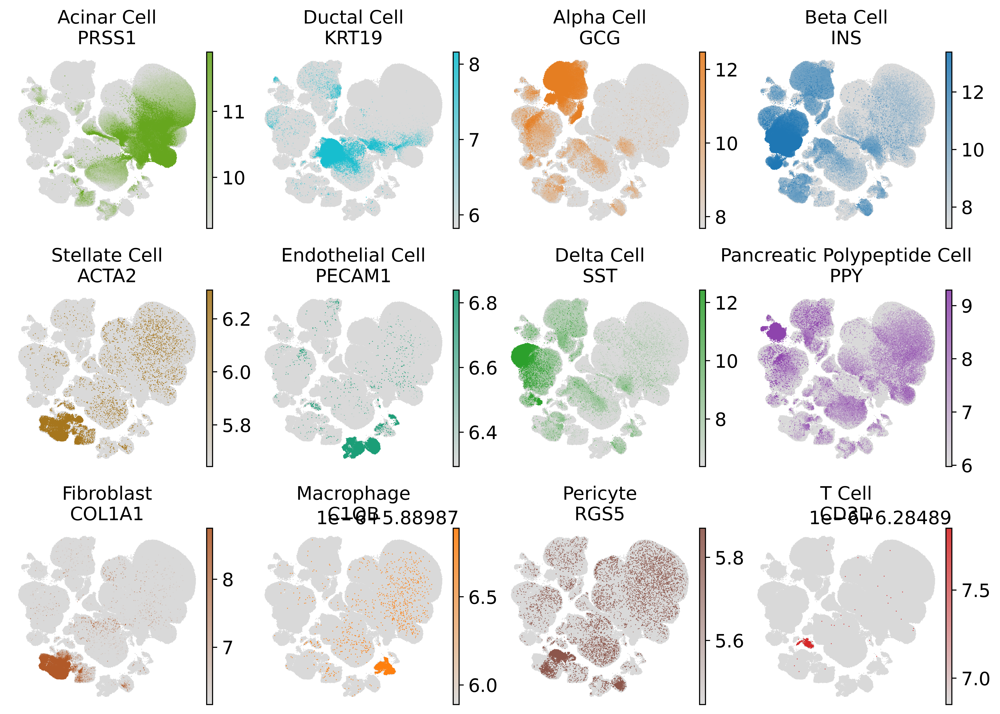

saved /lustre/groups/ml01/workspace/hpca/hpca_downstream/annotation_plotting/level_3_markers/level_3_marker_umaps.svg


In [9]:
import numpy as np
import matplotlib.colors as mcolors
from pathlib import Path

# Canonical markers for the main Level_3 lineages (ordered by abundance)
LEVEL_3_MARKERS = [
    ('Acinar Cell', 'PRSS1'),                 # digestive enzyme
    ('Ductal Cell', 'KRT19'),                 # ductal cytokeratin
    ('Alpha Cell', 'GCG'),                    # glucagon
    ('Beta Cell', 'INS'),                     # insulin
    ('Stellate Cell', 'ACTA2'),                # pancreatic stellate / myofibroblast
    ('Endothelial Cell', 'PECAM1'),           # vascular endothelium
    ('Delta Cell', 'SST'),                    # somatostatin
    ('Pancreatic Polypeptide Cell', 'PPY'),   # pancreatic polypeptide
    ('Fibroblast', 'COL1A1'),                 # matrix-producing fibroblast
    ('Macrophage', 'C1QB'),                   # myeloid macrophage
    ('Pericyte', 'RGS5'),                     # mural / pericyte
    #('Mixed Endocrine Cell', 'CHGA'),         # pan-endocrine granule protein
    ('T Cell', 'CD3D'),                       # T-cell receptor complex
]

LOW_EXPR_GREY = '#d9d9d9'
MARKER_UMAP_DIR = Path(
    '/lustre/groups/ml01/workspace/hpca/hpca_downstream/annotation_plotting/level_3_markers'
)
MARKER_UMAP_DIR.mkdir(parents=True, exist_ok=True)


def _gene_expression(adata, gene: str) -> np.ndarray:
    x = adata[:, gene].X
    return x.toarray().ravel() if hasattr(x, 'toarray') else np.asarray(x).ravel()


def _expression_vmin(expr: np.ndarray, pct: float = 50.0) -> float:
    """Threshold below which cells are drawn in grey."""
    positive = expr[expr > 0]
    if positive.size == 0:
        return 0.0
    return float(np.percentile(positive, pct))


def _lineage_cmap(hex_color: str):
    cmap = mcolors.LinearSegmentedColormap.from_list(
        'lineage_expr', [LOW_EXPR_GREY, hex_color], N=256
    )
    cmap.set_under(LOW_EXPR_GREY)
    return cmap


n_markers = len(LEVEL_3_MARKERS)
ncols = 4
nrows = int(np.ceil(n_markers / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(3.2 * ncols, 3.0 * nrows))
axes = np.atleast_1d(axes).ravel()

for ax, (celltype, gene) in zip(axes, LEVEL_3_MARKERS):
    expr = _gene_expression(adata, gene)
    vmin = _expression_vmin(expr)
    vmax = float(np.percentile(expr, 99)) if np.any(expr > 0) else 1.0
    if vmax <= vmin:
        vmax = vmin + 1e-6

    sc.pl.umap(
        adata,
        color=gene,
        ax=ax,
        show=False,
        frameon=False,
        size=2,
        alpha=0.9,
        cmap=_lineage_cmap(hpca_colors['Level_3'][celltype]),
        vmin=vmin,
        vmax=vmax,
        legend_loc=None,
        title=f'{celltype}\n{gene}',
    )

for ax in axes[n_markers:]:
    ax.axis('off')

fig.subplots_adjust(wspace=0.15, hspace=0.35)
out_path = MARKER_UMAP_DIR / 'level_3_marker_umaps.svg'
fig.savefig(out_path, format='svg', bbox_inches='tight', pad_inches=0.2)
plt.show()
print(f'saved {out_path}')

## Per–Level_2 UMAPs (recomputed, colored by Level_4)

For each `Level_2` lineage, subset the object, recompute neighbors on `X_emb` and UMAP, then plot cells colored by `Level_4`.

In [11]:
from pathlib import Path
import re

LEVEL_2_UMAP_DIR = Path(
    '/lustre/groups/ml01/workspace/hpca/hpca_downstream/annotation_plotting/level_2_subsets'
)
LEVEL_2_UMAP_DIR.mkdir(parents=True, exist_ok=True)
N_NEIGHBORS = 100


def slugify(label: str) -> str:
    return re.sub(r'[^\w\-]+', '_', label).strip('_')


def recompute_umap(adata_sub, n_neighbors: int = N_NEIGHBORS):
    """Recompute neighbors and UMAP on a subset using the integrated embedding."""
    adata_sub = adata_sub.copy()
    n_neighbors = min(n_neighbors, adata_sub.n_obs - 1)
    sc.pp.neighbors(adata_sub, use_rep='X_emb', n_neighbors=n_neighbors)
    sc.tl.umap(adata_sub, min_dist=0.75)
    return adata_sub


level_2_labels = (
    adata.obs['Level_2'].cat.categories
    if hasattr(adata.obs['Level_2'], 'cat')
    else sorted(adata.obs['Level_2'].unique())
)
level_2_labels

Index(['Endothelial Cell', 'Epithelial - Endocrine', 'Epithelial - Exocrine',
       'Epithelial - Mixed Endocrine', 'Immune - Lymphoid', 'Immune - Myeloid',
       'Neural / Glial', 'Stromal'],
      dtype='object')

In [9]:
for label in level_2_labels:
    n_cells = int((adata.obs['Level_2'] == label).sum())
    print(f'{label}: {n_cells:,} cells')
    sub = adata[adata.obs['Level_2'] == label]
    sub = recompute_umap(sub)

    fig = sc.pl.umap(
        sub,
        color='Level_4',
        frameon=False,
        show=False,
        title=label,
    ).figure
    out_path = LEVEL_2_UMAP_DIR / f'{slugify(label)}_level4_umap.svg'
    fig.savefig(out_path, format='svg', bbox_inches='tight', pad_inches=0.3)
    plt.close(fig)
    print(f'  saved {out_path}')

Endothelial Cell: 18,726 cells
  saved /lustre/groups/ml01/workspace/hpca/hpca_downstream/annotation_plotting/level_2_subsets/Endothelial_Cell_level4_umap.svg
Epithelial - Endocrine: 261,908 cells
  saved /lustre/groups/ml01/workspace/hpca/hpca_downstream/annotation_plotting/level_2_subsets/Epithelial_-_Endocrine_level4_umap.svg
Epithelial - Exocrine: 605,212 cells
  saved /lustre/groups/ml01/workspace/hpca/hpca_downstream/annotation_plotting/level_2_subsets/Epithelial_-_Exocrine_level4_umap.svg
Epithelial - Mixed Endocrine: 4,898 cells
  saved /lustre/groups/ml01/workspace/hpca/hpca_downstream/annotation_plotting/level_2_subsets/Epithelial_-_Mixed_Endocrine_level4_umap.svg
Immune - Lymphoid: 3,775 cells
  saved /lustre/groups/ml01/workspace/hpca/hpca_downstream/annotation_plotting/level_2_subsets/Immune_-_Lymphoid_level4_umap.svg
Immune - Myeloid: 6,674 cells
  saved /lustre/groups/ml01/workspace/hpca/hpca_downstream/annotation_plotting/level_2_subsets/Immune_-_Myeloid_level4_umap.svg

In [12]:
for label in level_2_labels:
    n_cells = int((adata.obs['Level_2'] == label).sum())
    print(f'{label}: {n_cells:,} cells')
    labels_to_plot = adata[adata.obs['Level_2'] == label].obs['Level_4'].unique().tolist()

    fig = sc.pl.umap(
        adata,
        color='Level_4',
        frameon=False,
        show=False,
        title=label,
        size=10,
        sort_order=True,
        groups=labels_to_plot,
        add_outline=True,
        outline_width=(0.1, 0.05),
        outline_color=['white', 'black'],
        na_color='lightgray',
        alpha=0.75,
        na_in_legend=False,
    ).figure
    out_path = LEVEL_2_UMAP_DIR / f'{slugify(label)}_level4_umap_healthy_global.svg'
    fig.savefig(out_path, format='svg', bbox_inches='tight', pad_inches=0.3)
    plt.close(fig)
    print(f'  saved {out_path}')

Endothelial Cell: 14,857 cells
  saved /lustre/groups/ml01/workspace/hpca/hpca_downstream/annotation_plotting/level_2_subsets/Endothelial_Cell_level4_umap_healthy_global.svg
Epithelial - Endocrine: 213,655 cells
  saved /lustre/groups/ml01/workspace/hpca/hpca_downstream/annotation_plotting/level_2_subsets/Epithelial_-_Endocrine_level4_umap_healthy_global.svg
Epithelial - Exocrine: 538,355 cells
  saved /lustre/groups/ml01/workspace/hpca/hpca_downstream/annotation_plotting/level_2_subsets/Epithelial_-_Exocrine_level4_umap_healthy_global.svg
Epithelial - Mixed Endocrine: 4,555 cells
  saved /lustre/groups/ml01/workspace/hpca/hpca_downstream/annotation_plotting/level_2_subsets/Epithelial_-_Mixed_Endocrine_level4_umap_healthy_global.svg
Immune - Lymphoid: 3,471 cells
  saved /lustre/groups/ml01/workspace/hpca/hpca_downstream/annotation_plotting/level_2_subsets/Immune_-_Lymphoid_level4_umap_healthy_global.svg
Immune - Myeloid: 5,990 cells
  saved /lustre/groups/ml01/workspace/hpca/hpca_down

In [19]:
hierarchy = adata.obs[['Level_1', 'Level_2', 'Level_3', 'Level_4']]

In [20]:
hierarchy['Level_1'] = '1: '+hierarchy['Level_1'].astype('str')
hierarchy['Level_2'] = '2: '+hierarchy['Level_2'].astype('str')
hierarchy['Level_3'] = '3: '+hierarchy['Level_3'].astype('str')
hierarchy['Level_4'] = '4: '+hierarchy['Level_4'].astype('str')

/tmp/ipykernel_668509/1670530121.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hierarchy['Level_1'] = '1: '+hierarchy['Level_1'].astype('str')
/tmp/ipykernel_668509/1670530121.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hierarchy['Level_2'] = '2: '+hierarchy['Level_2'].astype('str')
/tmp/ipykernel_668509/1670530121.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the doc

In [21]:
df = hierarchy

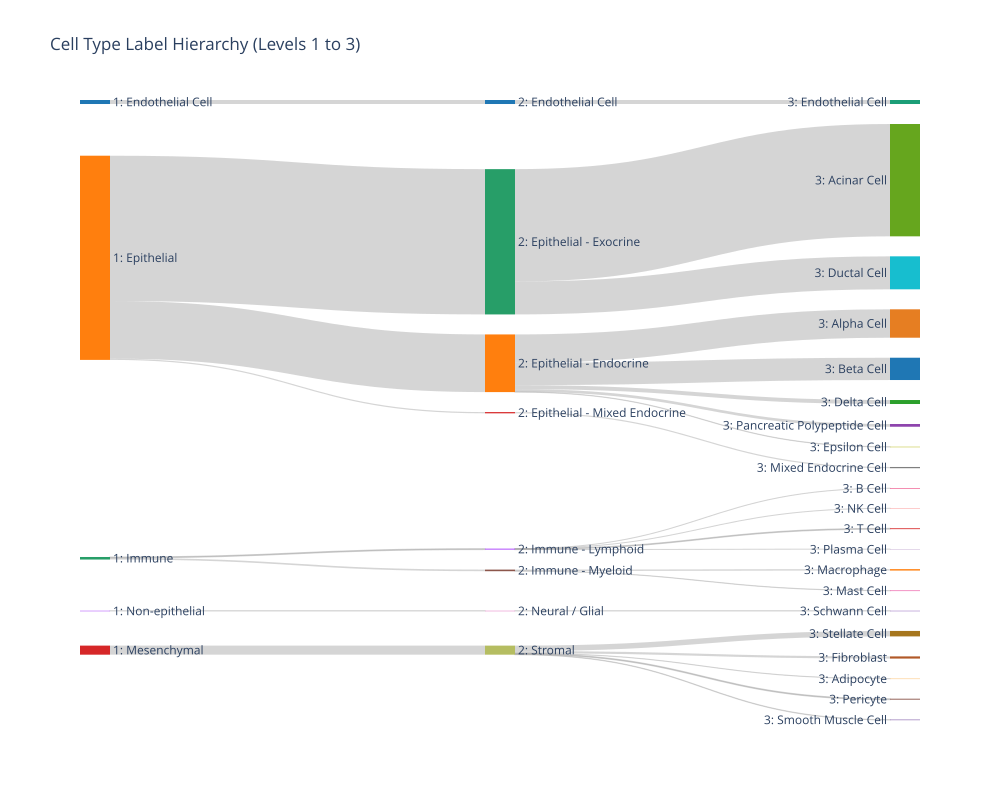

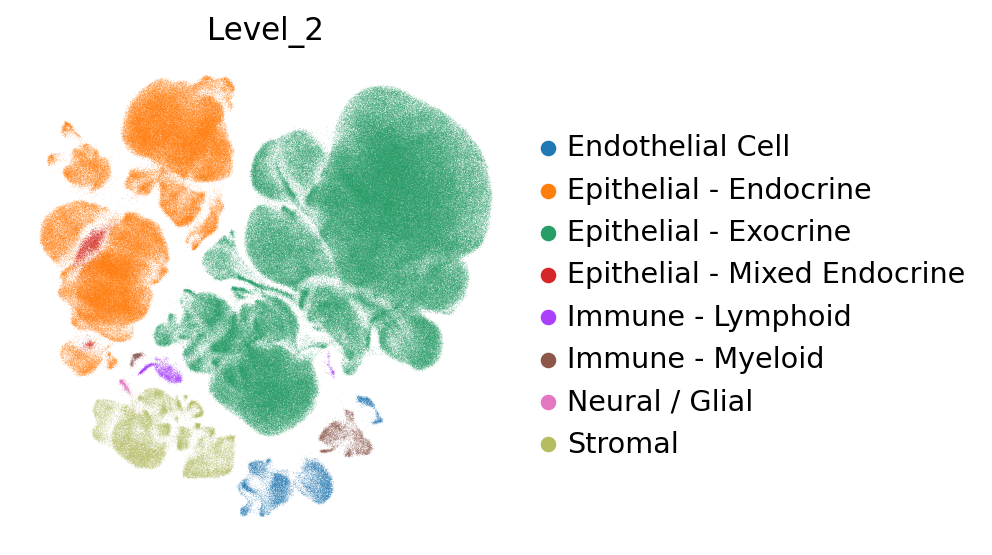

In [22]:
import plotly.graph_objects as go
import matplotlib.colors as mcolors


def _to_hex(color):
    return mcolors.to_hex(color, keep_alpha=False)


def _ensure_umap_colors(adata, key, custom_palette=None):
    """Register the same categorical colors scanpy uses on UMAP."""
    if custom_palette is not None:
        cats = adata.obs[key].astype('category').cat.categories
        adata.uns[f'{key}_colors'] = [
            _to_hex(custom_palette.get(str(cat), '#cccccc')) for cat in cats
        ]
    elif f'{key}_colors' not in adata.uns:
        sc.pl.umap(adata, color=key, show=False)


def _sankey_node_color_lookup(adata, hpca_colors=None):
    """Map Sankey node labels (e.g. '3: Alpha Cell') to UMAP hex colors."""
    lookup = {}
    for key in ('Level_1', 'Level_2', 'Level_3'):
        level_num = key.split('_')[1]
        palette = hpca_colors.get(key) if hpca_colors else None
        _ensure_umap_colors(adata, key, palette)
        cats = adata.obs[key].astype('category').cat.categories
        for cat, color in zip(cats, adata.uns[f'{key}_colors']):
            lookup[f'{level_num}: {cat}'] = _to_hex(color)
    return lookup


def _hex_to_rgba(hex_color, alpha=0.35):
    r, g, b = mcolors.to_rgb(hex_color)
    return f'rgba({int(r * 255)},{int(g * 255)},{int(b * 255)},{alpha})'


# 1. Aggregate the links for Level 1 -> Level 2
links_1 = df.groupby(['Level_1', 'Level_2']).size().reset_index(name='value')
links_1.columns = ['source', 'target', 'value']

# 2. Aggregate the links for Level 2 -> Level 3
links_2 = df.groupby(['Level_2', 'Level_3']).size().reset_index(name='value')
links_2.columns = ['source', 'target', 'value']

# 3. Combine them into a single list of all connections
links = pd.concat([links_1, links_2], axis=0, ignore_index=True)

# 4. Create a unique integer ID for every single node in the plot
unique_nodes = list(pd.unique(links[['source', 'target']].values.ravel('K')))
node_mapping = {node: i for i, node in enumerate(unique_nodes)}

# 5. Map the string names to their new integer IDs
links['source_idx'] = links['source'].map(node_mapping)
links['target_idx'] = links['target'].map(node_mapping)

# 6. Node/link colors matching the corresponding-level UMAP palettes
node_color_lookup = _sankey_node_color_lookup(adata, hpca_colors)
node_colors = [node_color_lookup.get(node, '#cccccc') for node in unique_nodes]
link_colors = [
    _hex_to_rgba(node_colors[src_idx])
    for src_idx in links['source_idx']
]

# 7. Build the Plotly Sankey diagram
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=20,
        thickness=30,
        line=dict(width=0),
        label=unique_nodes,
        color=node_colors,
    ),
    link=dict(
        source=links['source_idx'],
        target=links['target_idx'],
        value=links['value'],
        #color=link_colors,
        color="rgba(150, 150, 150, 0.4)",
    ),
)])

fig.update_layout(
    title_text='Cell Type Label Hierarchy (Levels 1 to 3)',
    font_size=12,
    width=1000,
    height=800,
)

fig.show(renderer='svg')
fig.write_image('/lustre/groups/ml01/workspace/hpca/hpca_downstream/label_technology_mixing/sankey_label_hierarchy.svg')